In [21]:
import os, glob
import numpy as np
import xarray as xr
from enum import Enum
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from glob import glob
import sys
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
sys.path.append('modules')
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import constants
sys.path.append(constants.MODULE_DIR)
import open_ds
import xarray_class_accessors as xca
from importlib import reload
import sn_plotting
import utils
from warnings import filterwarnings
filterwarnings('ignore')
import open_ds
import classes
import signal_to_noise

In [5]:
from classes import LocationsLatLon, ExperimentTypes

In [31]:
notebook_number = '05'

In [6]:
variable = 'pr'
window = 'window_101_length_1000'
ROOT_DIR = os.path.join(constants.LONGRUNMIP_DIR, variable)
ROOT_DIR_REGRID = os.path.join(ROOT_DIR, 'regrid_retimestamped')
ROOT_DIR_SN = os.path.join(ROOT_DIR, 'signal_to_noise',window)

In [7]:
models_to_get = open_ds.get_models_longer_than_length()
utils.pprint_list(models_to_get, num_start_items=7)

lenght = 7
 0. ccsm3
 1. cesm104
 2. cnrmcm61
 3. hadcm3l
 4. ipslcm5a
 5. mpiesm11
 6. mpiesm12


In [13]:
files_to_open_signal_to_noise = open_ds.get_file_names_from_from_directory(ROOT_DIR_SN,
                                                           classes.ExperimentTypes.SIGNAL_TO_NOISE,
                                                          models_to_get)

files_to_open_signal_to_noise_stable =\
                        open_ds.get_file_names_from_from_directory(ROOT_DIR_SN,
                                               classes.ExperimentTypes.SIGNAL_TO_NOISE_STABLE,
                                              models_to_get)
utils.pprint_list(files_to_open_signal_to_noise)

- model='cesm104' - found_fname=None - No file found
- model='cesm104' - found_fname=None - No file found
lenght = 6
 0. signal_to_noise/ccsm3_signal_to_noise.nc
 1. signal_to_noise/cnrmcm61_signal_to_noise.nc


In [14]:
files_to_open_experiment = open_ds.get_file_names_from_from_directory(ROOT_DIR_REGRID,
                                                           ExperimentTypes.ABRUPT4X,
                                                           models_to_get)

files_to_open_control = open_ds.get_file_names_from_from_directory(ROOT_DIR_REGRID,
                                                           ExperimentTypes.CONTROL,
                                                           models_to_get)
utils.pprint_list(files_to_open_experiment)

lenght = 7
 0. pr_mon_CCSM3_abrupt4x_2120_g025.nc
 1. pr_mon_CESM104_abrupt4x_5900_g025.nc


In [23]:
stable_ds = open_ds.open_and_concat_nc_files(files_to_open_signal_to_noise_stable, ROOT_DIR_SN, model_index=0)

Removing coords - ['variable']


In [24]:
stable_ds

<xarray.Dataset>
Dimensions:          (time: 1100, lon: 144, lat: 72, model: 6, variable: 1)
Coordinates:
  * time             (time) object 0001-12-31 00:00:00 ... 1100-12-31 00:00:00
  * lon              (lon) float32 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * lat              (lat) float32 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * model            (model) object 'ccsm3' 'cnrmcm61' ... 'mpiesm11' 'mpiesm12'
Dimensions without coordinates: variable
Data variables:
    signal_to_noise  (model, variable, time, lat, lon) float64 nan nan ... nan
    lower_bound      (model, variable, lat, lon) float64 -0.7634 ... -0.802
    upper_bound      (model, variable, lat, lon) float64 1.035 1.048 ... 0.9053

In [15]:
reload(open_ds)
sn_ds = open_ds.open_and_concat_nc_files(files_to_open_signal_to_noise, ROOT_DIR_SN, model_index=0)
sn_ds

Removing coords - ['variable']


<xarray.Dataset>
Dimensions:          (time: 1100, lon: 144, lat: 72, model: 6, variable: 1)
Coordinates:
  * time             (time) object 0001-12-31 00:00:00 ... 1100-12-31 00:00:00
  * lon              (lon) float32 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * lat              (lat) float32 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * model            (model) object 'ccsm3' 'cnrmcm61' ... 'mpiesm11' 'mpiesm12'
Dimensions without coordinates: variable
Data variables:
    signal_to_noise  (model, variable, time, lat, lon) float64 1.559 ... nan
    lower_bound      (model, variable, lat, lon) float64 -0.7634 ... -0.802
    upper_bound      (model, variable, lat, lon) float64 1.035 1.048 ... 0.9053

In [16]:
abrupt4x_ds = open_ds.read_and_merge_netcdfs(files_to_open_experiment, ROOT_DIR_REGRID)
control_ds = open_ds.read_and_merge_netcdfs(files_to_open_control, ROOT_DIR_REGRID)

- model='cesm104' is too short has time_length=112 < requested_length=800
(fname='pr_mon_CESM104_abrupt4x_5900_g025.nc')


In [17]:
# Anomalies
abrupt4x_anom_ds = abrupt4x_ds.clima_ds.anomalies(control_ds)

ccsm3, cnrmcm61, hadcm3l, ipslcm5a, mpiesm11, mpiesm12, 

In [18]:
period_list = (utils.create_period_list(step = 25, end = 2, start = 0) +
               utils.create_period_list(step = 50, end = 9, start = 1)) 
period_list

[(0, 24),
 (25, 49),
 (50, 99),
 (100, 149),
 (150, 199),
 (200, 249),
 (250, 299),
 (300, 349),
 (350, 399),
 (400, 449)]

In [25]:
percent_stable_ds = signal_to_noise.percent_of_non_nan_points_in_period(stable_ds, period_list)

(0, 24) - 25 years
(25, 49) - 25 years
(50, 99) - 50 years
(100, 149) - 50 years
(150, 199) - 50 years
(200, 249) - 50 years
(250, 299) - 50 years
(300, 349) - 50 years
(350, 399) - 50 years
(400, 449) - 50 years


In [26]:
percent_stable_ds

<xarray.Dataset>
Dimensions:      (lon: 144, lat: 72, period: 10, variable: 1, model: 6)
Coordinates:
  * lon          (lon) float32 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
  * lat          (lat) float32 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period       (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
  * model        (model) object 'ccsm3' 'cnrmcm61' ... 'mpiesm11' 'mpiesm12'
Dimensions without coordinates: variable
Data variables:
    mean         (period, variable, lat, lon) float64 59.33 59.33 ... 94.67
    uncertainty  (period, variable, lat, lon) float64 96.0 96.0 ... 20.0 20.0
    percent      (period, model, variable, lat, lon) float64 64.0 64.0 ... 98.0

## Plotting

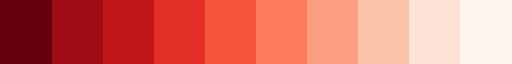

In [27]:
cmap = plt.cm.get_cmap('Reds_r', 10)
cmap

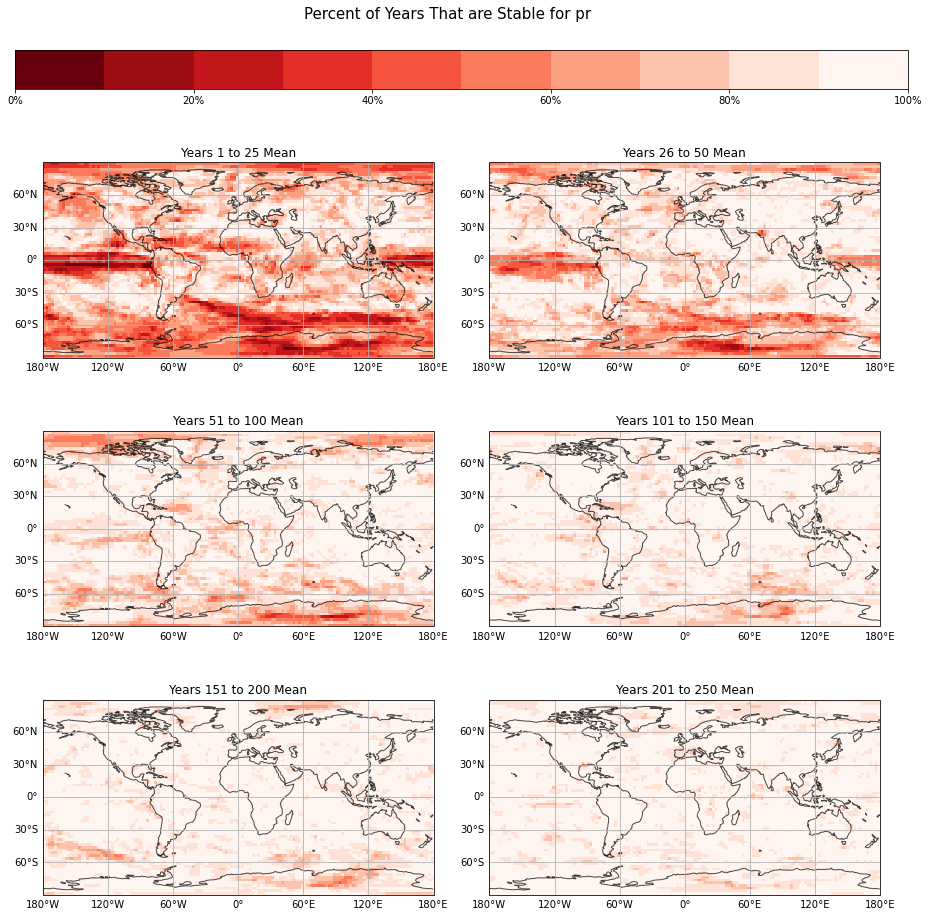

In [34]:
#### This will errror. See above for reeasons why

periods = percent_stable_ds.period.values[:6]

fig, gs, cbar = sn_plotting.plot_all_period_maps(percent_stable_ds['mean'].to_dataset(), periods,
                                       suptitle = f'Percent of Years That are Stable for {variable}', cmap=cmap, 
                                      col_increase = 2)
fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, 
                         f'{notebook_number}_{variable}_percent_years_stable_{window}.png'),
           bbox_inches='tight', dpi=250)


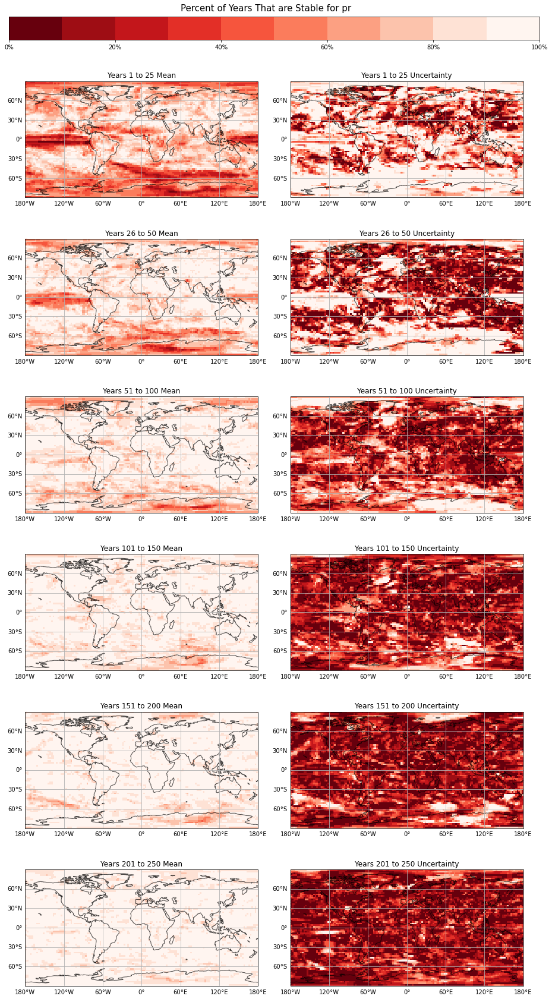

In [42]:
periods = percent_stable_ds.period.values[:6]

fig, gs, cbar =  sn_plotting.plot_all_period_maps(percent_stable_ds[['mean', 'uncertainty']], periods,
                                       suptitle = f'Percent of Years That are Stable for {variable}', cmap=cmap,
                                                 row_increase=1)

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, 
                         f'{notebook_number}_{variable}_percent_years_stable_and_uncertainty_{window}.png'),
           bbox_inches='tight', dpi=250)

In [50]:
percent_stable_ds

<xarray.Dataset>
Dimensions:      (lon: 144, lat: 72, period: 10, variable: 1, model: 6)
Coordinates:
  * lon          (lon) float32 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
  * lat          (lat) float32 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period       (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
  * model        (model) object 'ccsm3' 'cnrmcm61' ... 'mpiesm11' 'mpiesm12'
Dimensions without coordinates: variable
Data variables:
    mean         (period, variable, lat, lon) float64 59.33 59.33 ... 94.67
    uncertainty  (period, variable, lat, lon) float64 96.0 96.0 ... 20.0 20.0
    percent      (period, model, variable, lat, lon) float64 64.0 64.0 ... 98.0

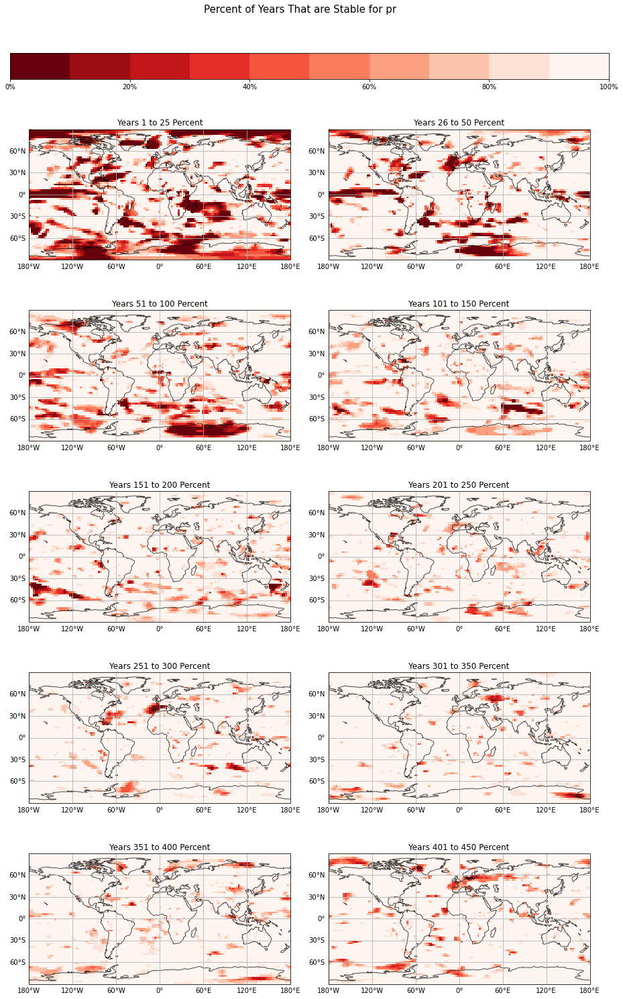

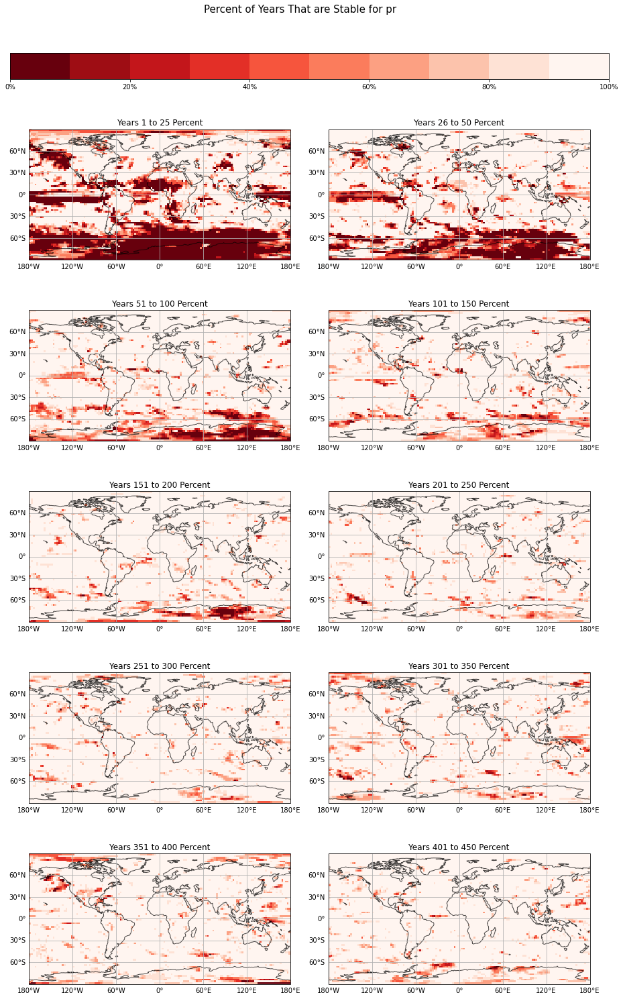

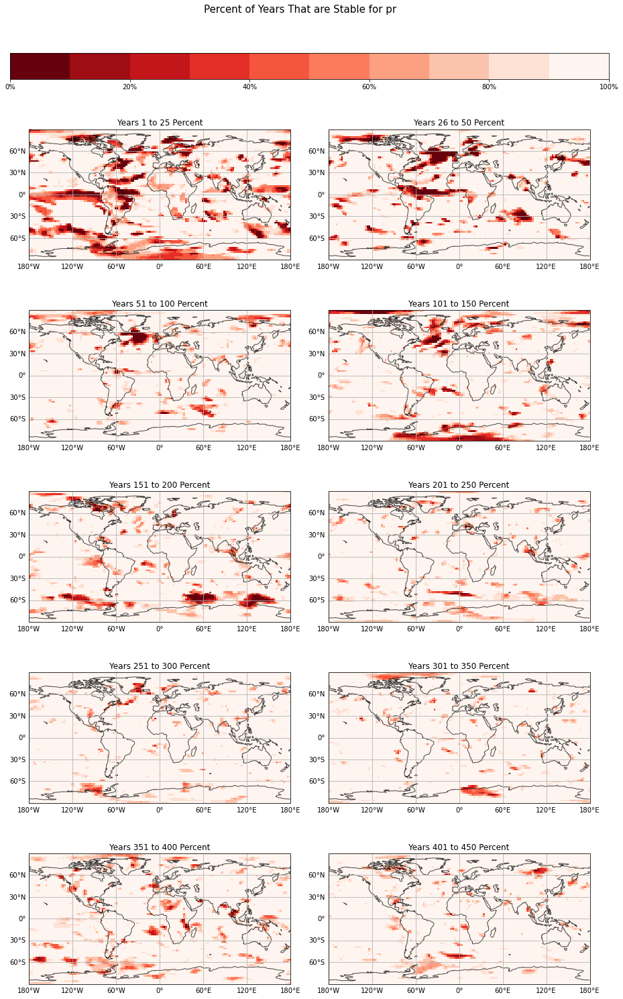

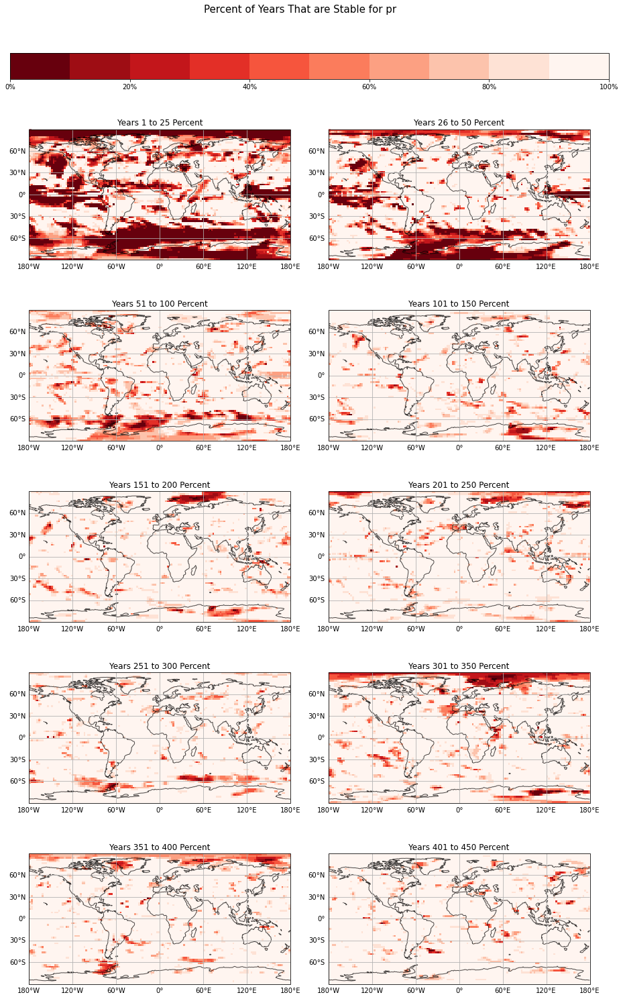

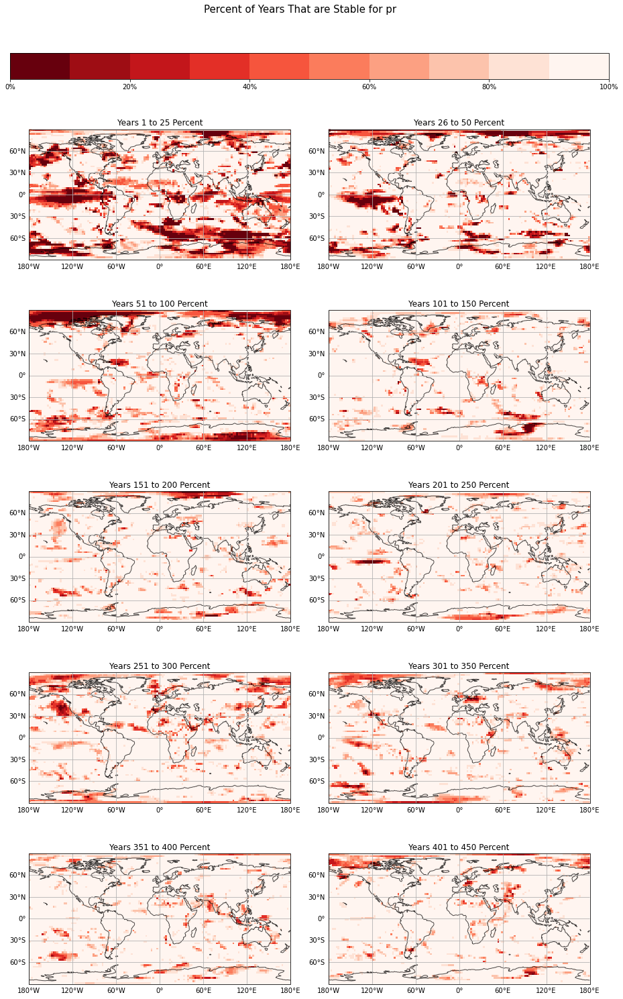

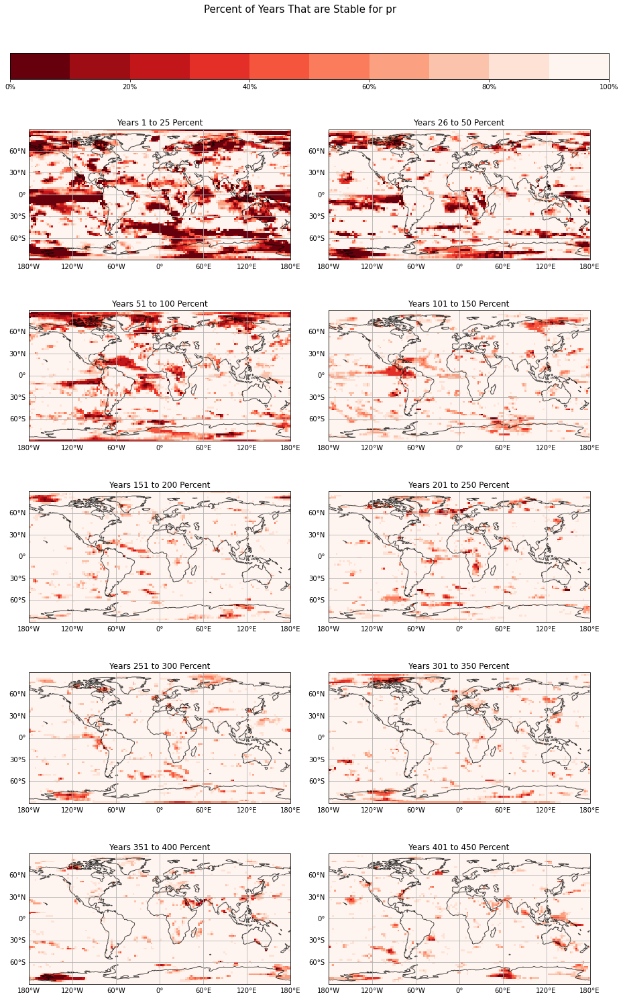

In [51]:
periods = percent_stable_ds.period.values
models = percent_stable_ds.model.values
for model in models:
    fig, gs, cbar = sn_plotting.plot_all_period_maps(
                    percent_stable_ds[['percent']].sel(model=model), periods,
                                           suptitle = f'Percent of Years That are Stable for {variable}',
                                            cmap=cmap, 
                                          col_increase = 2)
    fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, 
                f'{notebook_number}_{variable}_percent_years_stable_and_uncertainty_{window}_{model}.png'),
               bbox_inches='tight', dpi=250)

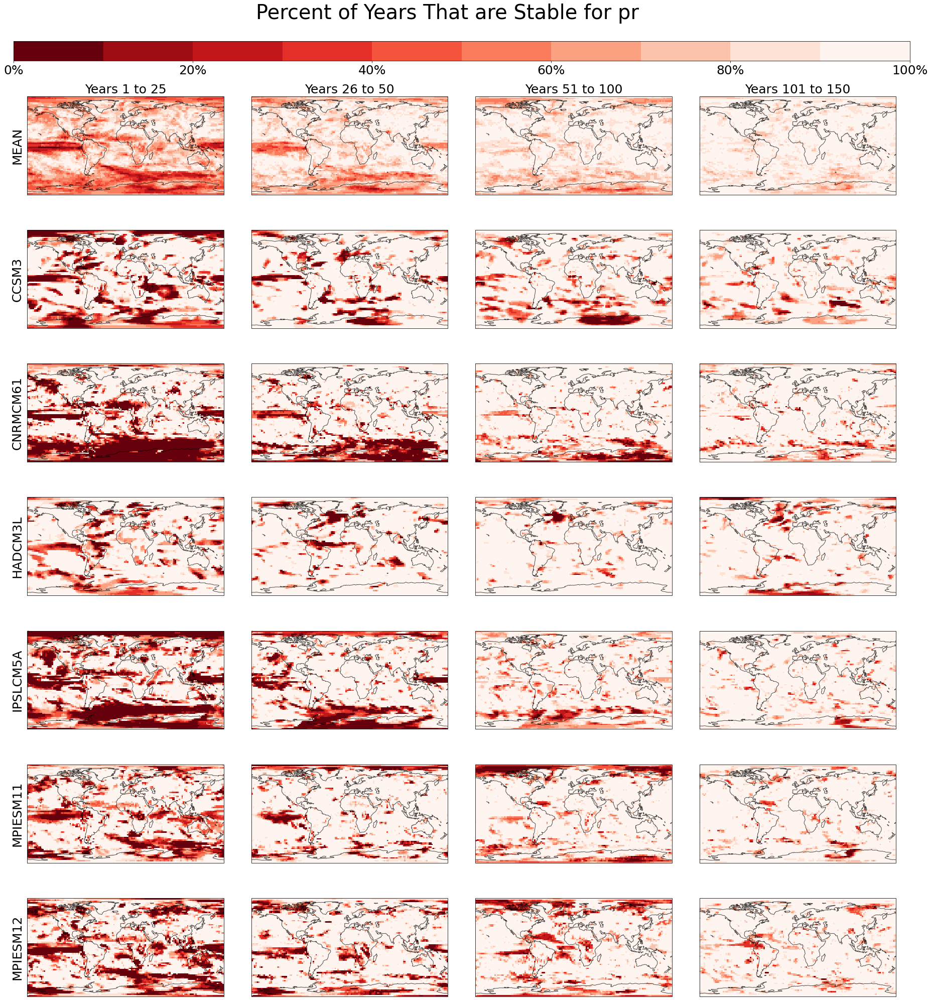

In [56]:
periods = percent_stable_ds.period.values[:4]
models = percent_stable_ds.model.values
models = np.insert(models, 0, 'mean')

ncols = len(periods)
nrows = len(models)
fig = plt.figure(figsize = (8 * ncols, 5 * nrows))
fig.suptitle(f'Percent of Years That are Stable for {variable}', y=0.91, fontsize=40)

gs = gridspec.GridSpec(nrows + 1, ncols, height_ratios = [.2] + [1] * nrows, hspace=0.4, wspace=0)

for row_num, model in enumerate(models, 1):
    for col_num, period in enumerate(periods):
        ax = fig.add_subplot(gs[row_num, col_num], projection=ccrs.PlateCarree())
        
        if model == 'mean':
            da = percent_stable_ds['mean']
        else:
            da = percent_stable_ds['percent'].sel(model=model)

        pcolor = da.sel(period=period).plot(
            ax=ax, vmin=0, vmax=100, cmap=cmap, extend='neither', add_colorbar=False)
        ax.coastlines(alpha=0.7)

        if row_num == 1:
            ax.set_title(utils.convert_period_string(period), fontsize=25);
        else:
            ax.set_title('')
        
        if col_num == 0:
            ax.annotate(model.upper(), size=25, xy = (-.05, 0.5), clip_on=True, xycoords= 'axes fraction',
                       rotation=90, ha='center', va='center')
            
cbar = sn_plotting.format_colorbar(gs, pcolor, labelsize=25)  

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
        f'{notebook_number}_{variable}_percent_years_stable_{window}_all_models.png'),
           bbox_inches='tight')

# Pattern Correlation

In [128]:
percent_ds

<xarray.Dataset>
Dimensions:  (lon: 144, lat: 72, model: 9, period: 10)
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * model    (model) object 'IPSLCM5A' 'CNRMCM61' ... 'MPIESM11' 'CESM104'
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    percent  (period, model, lat, lon) float64 24.0 24.0 24.0 ... 88.0 88.0 88.0

In [129]:
percent_mean_ds

<xarray.DataArray 'percent' (period: 10, lat: 72, lon: 144)>
array([[[35.55555556, 35.55555556, 36.        , ..., 35.55555556,
         35.55555556, 35.11111111],
        [35.11111111, 34.66666667, 35.11111111, ..., 33.77777778,
         35.55555556, 34.22222222],
        [38.22222222, 37.77777778, 40.44444444, ..., 38.66666667,
         39.55555556, 38.22222222],
        ...,
        [26.22222222, 26.66666667, 28.        , ..., 25.33333333,
         25.77777778, 25.77777778],
        [24.88888889, 25.33333333, 25.33333333, ..., 22.66666667,
         23.11111111, 24.44444444],
        [26.66666667, 26.66666667, 26.66666667, ..., 26.66666667,
         26.66666667, 26.66666667]],

       [[66.22222222, 65.77777778, 65.77777778, ..., 66.66666667,
         67.11111111, 67.11111111],
        [60.44444444, 60.44444444, 60.        , ..., 61.77777778,
         60.        , 61.77777778],
        [63.11111111, 60.44444444, 59.55555556, ..., 62.66666667,
         62.22222222, 65.33333333],
...
        [92.44444444, 92.        , 91.33333333, ..., 90.44444444,
         92.        , 92.22222222],
        [87.77777778, 87.77777778, 87.77777778, ..., 87.55555556,
         87.77777778, 87.77777778],
        [84.44444444, 84.66666667, 84.88888889, ..., 84.22222222,
         84.22222222, 84.22222222]],

       [[94.22222222, 94.22222222, 94.22222222, ..., 94.        ,
         94.44444444, 94.44444444],
        [95.33333333, 95.33333333, 95.33333333, ..., 94.22222222,
         93.11111111, 95.33333333],
        [94.        , 94.22222222, 94.88888889, ..., 95.11111111,
         95.11111111, 94.66666667],
        ...,
        [97.55555556, 97.55555556, 97.55555556, ..., 96.88888889,
         96.88888889, 96.88888889],
        [96.66666667, 96.22222222, 96.        , ..., 96.        ,
         96.22222222, 96.66666667],
        [95.55555556, 95.55555556, 95.55555556, ..., 95.55555556,
         95.55555556, 95.55555556]]])
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'

In [130]:
model

'CESM104'

In [131]:
percent_ds

<xarray.Dataset>
Dimensions:  (lon: 144, lat: 72, model: 9, period: 10)
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * model    (model) object 'IPSLCM5A' 'CNRMCM61' ... 'MPIESM11' 'CESM104'
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    percent  (period, model, lat, lon) float64 24.0 24.0 24.0 ... 88.0 88.0 88.0

In [132]:

models = percent_ds.model.values
periods = percent_ds.period.values

pattern_corr_dict = {}
for period in periods:
#     flat_mean = percent_mean_ds.sel(period=period).values.flatten()
    period_dict = {}
    for model in models:
        
        percent_drop_model_ds = percent_ds.where(percent_ds.model.isin(models[models != model]), drop=True)
        percent_drop_model_ds = percent_drop_model_ds['percent'].sel(period = period)
        percent_drop_model_mean_np = percent_drop_model_ds.mean(dim='model').values.flatten()
        
        percent_da = percent_ds['percent'].sel(model=model, period=period)
        percent_np = percent_da.values.flatten()

        pattern_corr = spearmanr(percent_np, percent_drop_model_mean_np)

        period_dict[model] = pattern_corr[0]
    pattern_corr_dict[period] = period_dict

In [133]:
pattern_corr_df = pd.DataFrame(pattern_corr_dict)
pattern_corr_df

,0_24,25_49,50_99,100_149,150_199,200_249,250_299,300_349,350_399,400_449
IPSLCM5A,0.357160,0.583652,0.407047,0.155629,0.107268,0.221087,-0.001753,0.028064,0.143750,0.034933
CNRMCM61,0.624505,0.628574,0.406271,0.063841,0.143045,0.195973,0.189047,0.002872,0.196054,0.138280
HadCM3L,0.480382,0.078263,-0.073833,0.156754,0.197782,0.153336,0.162843,0.118573,0.195899,0.133144
MPIESM12,0.402736,0.520399,0.312985,0.253550,0.111051,0.184507,0.101143,0.009597,0.179888,0.089024
GISSE2R,0.482096,0.435225,0.260776,0.063040,0.059983,0.075878,0.033965,-0.075036,0.028220,0.066129
CCSM3,0.332711,0.183992,0.407280,0.169622,0.030572,0.262683,0.041797,0.048262,0.131593,0.070813
FAMOUS,0.110466,0.149901,0.253918,0.071493,0.016339,0.027377,0.183069,0.104115,0.116910,-0.021399
MPIESM11,0.524311,0.492653,0.210859,0.009693,-0.076129,0.020757,0.052264,-0.230590,-0.042382,-0.038819
CESM104,0.534120,0.517067,0.224631,0.242013,0.172853,0.103043,0.240169,-0.067032,0.178749,-0.017466


In [134]:
xticklabels = [convert_period_string(period) for period in percent_mean_ds.period.values]
xticklabels = [' '.join(x.split(' ')[1:]) for x in xticklabels] # Getting rid of "Years" string start
xticklabels

['1 to 25',
 '26 to 50',
 '51 to 100',
 '101 to 150',
 '151 to 200',
 '201 to 250',
 '251 to 300',
 '301 to 350',
 '351 to 400',
 '401 to 450']

Text(95.72222222222221, 0.5, 'Model')

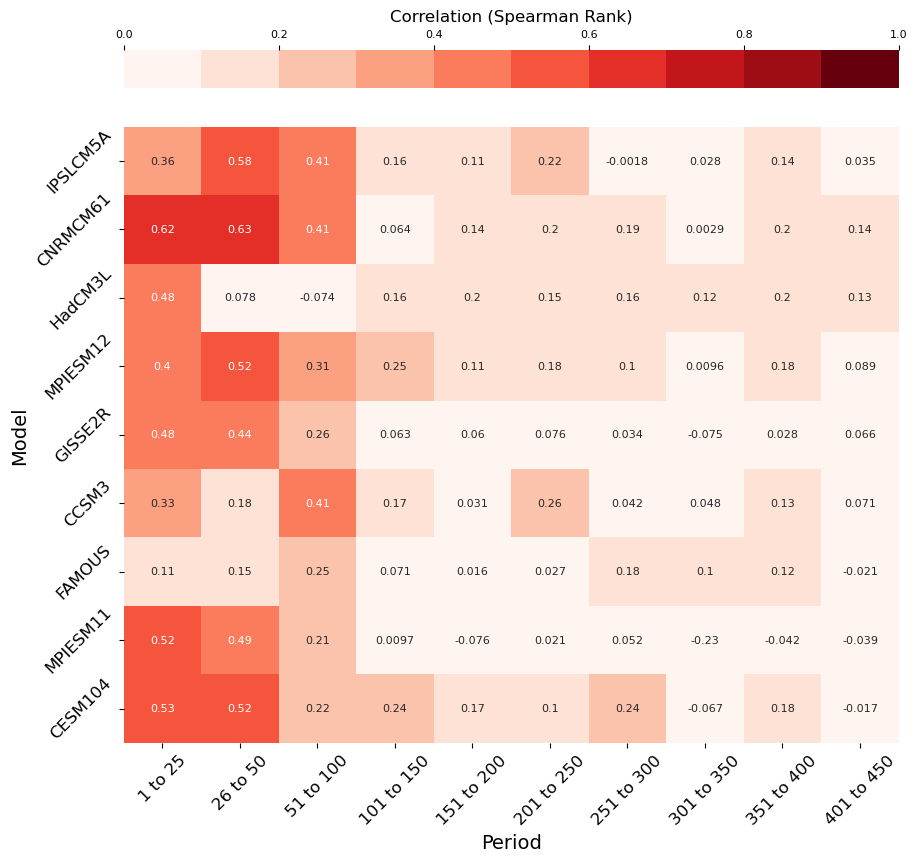

In [135]:
fig = plt.figure(figsize=(10,10))
ax = sns.heatmap(pattern_corr_df, cmap=cmap.reversed(), vmin=0, vmax=1, annot=True, 
           cbar_kws=dict(location='top'), xticklabels = xticklabels,
                annot_kws = dict(fontsize=8))


ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=12, rotation=45)
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=12, rotation=45)


cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=8)
cbar.ax.set_title('Correlation (Spearman Rank)', fontsize=12)

plt.xlabel("Period", size=14)
plt.ylabel("Model", size=14)

# fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, '07_percent_stable_heat_map.png'), 
#            bbox_inches='tight', dpi=200)

# HDI

## Load Data

In [136]:
ruby_dir = '/g/data/w40/rl5183'

In [137]:
hdi_ds = xr.open_dataset(os.path.join(ruby_dir, 'HDI_1990_2015_1x1.nc'))
hdi_ds

<xarray.Dataset>
Dimensions:  (time: 26, lon: 360, lat: 180)
Coordinates:
  * time     (time) float32 1.99e+03 1.991e+03 1.992e+03 ... 2.014e+03 2.015e+03
  * lon      (lon) float64 0.0 1.0 2.0 3.0 4.0 ... 355.0 356.0 357.0 358.0 359.0
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
Data variables:
    HDI      (time, lat, lon) float32 ...
Attributes:
    CDI:               Climate Data Interface version 1.9.8 (https://mpimet.m...
    Conventions:       CF-1.6
    history:           Fri Sep 10 15:10:46 2021: cdo remapcon,r360x180 HDI_19...
    creation_date:     02-Aug-2017 14:42:55
    resolution:        5 arc-min
    projection:        WGS84
    extent:            lat: 90�S - 90�N; lon: 180�E - 180�W
    product:           Human Development Index (HDI) for years 1990-2015
    citation:          When using the data, please refer to following publica...
    more information:  For more information, see: TBA
    CDO:               Climate Data Operators version 1.9.8 (https://mpimet.m...

## Re-grid xesmf

In [138]:
percent_mean_ds

<xarray.DataArray 'percent' (period: 10, lat: 72, lon: 144)>
array([[[35.55555556, 35.55555556, 36.        , ..., 35.55555556,
         35.55555556, 35.11111111],
        [35.11111111, 34.66666667, 35.11111111, ..., 33.77777778,
         35.55555556, 34.22222222],
        [38.22222222, 37.77777778, 40.44444444, ..., 38.66666667,
         39.55555556, 38.22222222],
        ...,
        [26.22222222, 26.66666667, 28.        , ..., 25.33333333,
         25.77777778, 25.77777778],
        [24.88888889, 25.33333333, 25.33333333, ..., 22.66666667,
         23.11111111, 24.44444444],
        [26.66666667, 26.66666667, 26.66666667, ..., 26.66666667,
         26.66666667, 26.66666667]],

       [[66.22222222, 65.77777778, 65.77777778, ..., 66.66666667,
         67.11111111, 67.11111111],
        [60.44444444, 60.44444444, 60.        , ..., 61.77777778,
         60.        , 61.77777778],
        [63.11111111, 60.44444444, 59.55555556, ..., 62.66666667,
         62.22222222, 65.33333333],
...
        [92.44444444, 92.        , 91.33333333, ..., 90.44444444,
         92.        , 92.22222222],
        [87.77777778, 87.77777778, 87.77777778, ..., 87.55555556,
         87.77777778, 87.77777778],
        [84.44444444, 84.66666667, 84.88888889, ..., 84.22222222,
         84.22222222, 84.22222222]],

       [[94.22222222, 94.22222222, 94.22222222, ..., 94.        ,
         94.44444444, 94.44444444],
        [95.33333333, 95.33333333, 95.33333333, ..., 94.22222222,
         93.11111111, 95.33333333],
        [94.        , 94.22222222, 94.88888889, ..., 95.11111111,
         95.11111111, 94.66666667],
        ...,
        [97.55555556, 97.55555556, 97.55555556, ..., 96.88888889,
         96.88888889, 96.88888889],
        [96.66666667, 96.22222222, 96.        , ..., 96.        ,
         96.22222222, 96.66666667],
        [95.55555556, 95.55555556, 95.55555556, ..., 95.55555556,
         95.55555556, 95.55555556]]])
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'

In [139]:
import xesmf

In [140]:
type(percent_mean_ds)

xarray.core.dataarray.DataArray

In [141]:
regridder = xesmf.Regridder(hdi_ds, percent_mean_ds.to_dataset(), method='conservative')
regridder

xESMF Regridder 
Regridding algorithm:       conservative 
Weight filename:            conservative_180x360_72x144.nc 
Reuse pre-computed weights? False 
Input grid shape:           (180, 360) 
Output grid shape:          (72, 144) 
Periodic in longitude?      False

In [142]:
hdi_regrid_ds = regridder(hdi_ds)

In [143]:
hdi_regrid_ds

<xarray.Dataset>
Dimensions:  (time: 26, lat: 72, lon: 144)
Coordinates:
  * time     (time) float32 1.99e+03 1.991e+03 1.992e+03 ... 2.014e+03 2.015e+03
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
Data variables:
    HDI      (time, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan
Attributes:
    regrid_method:  conservative

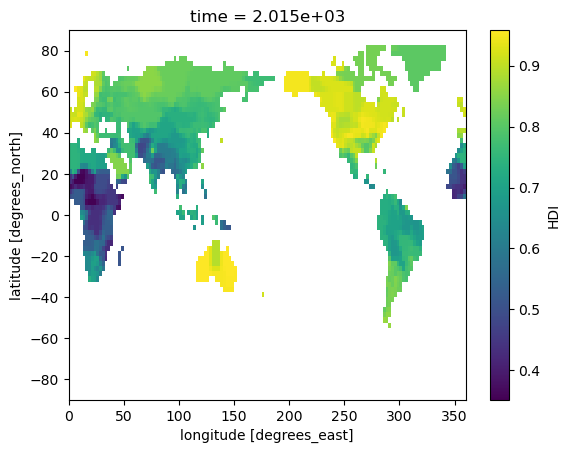

In [144]:
hdi_regrid_ds.isel(time=-1).HDI.plot()

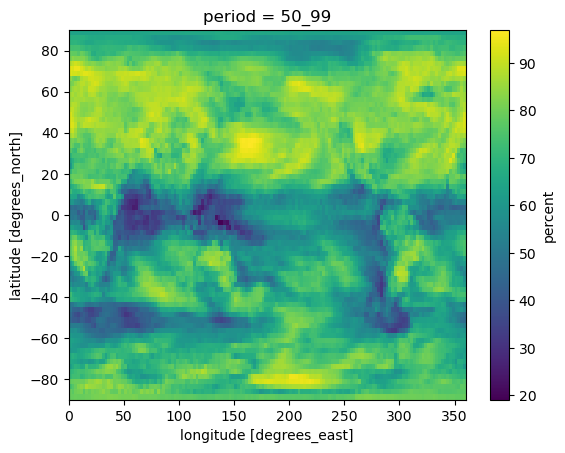

In [145]:
percent_mean_ds.sel(period='50_99').plot()

## Box Plot

In [440]:
class HDITheshold(tuple, Enum):
    LOW = (0, 0.55)
    MIDDLE = (0.55, 0.7)
    HIGH = (0.7, 1)

In [441]:
percent_mean_ds

<xarray.Dataset>
Dimensions:      (lon: 144, lat: 72, period: 10)
Coordinates:
  * lon          (lon) float64 1.25 3.75 6.25 8.75 ... 351.2 353.8 356.2 358.8
  * lat          (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * period       (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    mean         (period, lat, lon) float64 35.56 35.56 36.0 ... 95.56 95.56
    uncertainty  (period, lat, lon) float64 96.0 96.0 96.0 ... 10.0 10.0 10.0

In [ ]:
# HDI in 2016
hdi_regrid_single_t_da = hdi_regrid_ds.isel(time=-1).HDI

In [510]:
percent_ds

<xarray.Dataset>
Dimensions:  (lon: 144, lat: 72, model: 9, period: 10)
Coordinates:
  * lon      (lon) float64 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * lat      (lat) float64 -88.75 -86.25 -83.75 -81.25 ... 83.75 86.25 88.75
  * model    (model) object 'IPSLCM5A' 'CNRMCM61' ... 'MPIESM11' 'CESM104'
  * period   (period) object '0_24' '25_49' '50_99' ... '350_399' '400_449'
Data variables:
    percent  (period, model, lat, lon) float64 24.0 24.0 24.0 ... 88.0 88.0 88.0

In [520]:
percent_ds.sel(period=period)['percent'].values.flatten()

array([88., 88., 88., ..., 98., 98., 98.])

In [497]:
# Gettting the values that are just in each threshold.
periods = percent_mean_ds.period.values[:6]

period_values_dict = {}
for period in periods:
    percent_mean_da = percent_mean_ds['mean'].sel(period=period)
    threshold_dict = {}
    for threshold in HDITheshold:
        print(f'{period=}, {threshold.value=}')
        # Values in the threshold range
        hdi_in_threshold_da = hdi_regrid_single_t_da.where(
            np.logical_and(
                hdi_regrid_single_t_da > threshold.value[0], 
                hdi_regrid_single_t_da < threshold.value[1]))

        
        # The percent mean values that occur here.
        percent_mean_in_hdi_threshold_da = percent_mean_da.where(np.isfinite(hdi_in_threshold_da))
        
        # Converting to a numpy array
        percent_mean_in_hdi_threshold_values = percent_mean_in_hdi_threshold_da.values
        # Remove nans
        percent_mean_in_hdi_threshold_values = (percent_mean_in_hdi_threshold_values[
                        np.isfinite(percent_mean_in_hdi_threshold_values)])
        
        threshold_dict[threshold.name] = percent_mean_in_hdi_threshold_values
    period_values_dict[period] = threshold_dict


period='0_24', threshold.value=(0, 0.55)
period='0_24', threshold.value=(0.55, 0.7)
period='0_24', threshold.value=(0.7, 1)
period='25_49', threshold.value=(0, 0.55)
period='25_49', threshold.value=(0.55, 0.7)
period='25_49', threshold.value=(0.7, 1)
period='50_99', threshold.value=(0, 0.55)
period='50_99', threshold.value=(0.55, 0.7)
period='50_99', threshold.value=(0.7, 1)
period='100_149', threshold.value=(0, 0.55)
period='100_149', threshold.value=(0.55, 0.7)
period='100_149', threshold.value=(0.7, 1)
period='150_199', threshold.value=(0, 0.55)
period='150_199', threshold.value=(0.55, 0.7)
period='150_199', threshold.value=(0.7, 1)
period='200_249', threshold.value=(0, 0.55)
period='200_249', threshold.value=(0.55, 0.7)
period='200_249', threshold.value=(0.7, 1)


In [498]:
period_values_dict.keys()

dict_keys(['0_24', '25_49', '50_99', '100_149', '150_199', '200_249'])

In [546]:
for values in list(period_values_dict[period].values()):
    print(len(values))

274
278
1695


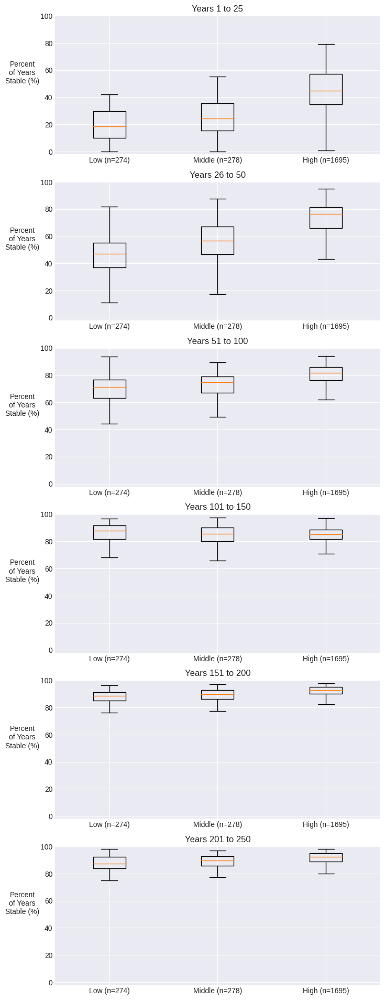

In [552]:
periods = period_values_dict.keys()

fig = plt.figure(figsize=(8, 24))

for plot_num, period in enumerate(periods, 1):
    
    ax = fig.add_subplot(len(periods),1,plot_num)
#     keys = list(period_values_dict[period]))
    values = list(period_values_dict[period].values())
    ax.boxplot(values, showfliers=False);
    
    xtick_labels = []
    for key, value in period_values_dict[period].items():
        xtick_labels.append(f'{key.capitalize()} (n={len(value)})')
    
    ax.set_xticklabels(xtick_labels)
    
    ax.set_title(utils.convert_period_string(period))
    
    ax.set_ylim(-2, 100)
    ax.set_ylabel('Percent\nof Years\nStable (%)', size=10, rotation=0, labelpad=25)
    
fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, '07_perent_stable_hdi_box_plot_window_51.png'),
           bbox_inches='tight', dpi =300)

## Scatter PLot

In [146]:
hdi_regrid_single_t_da = hdi_regrid_ds.isel(time=-1).HDI

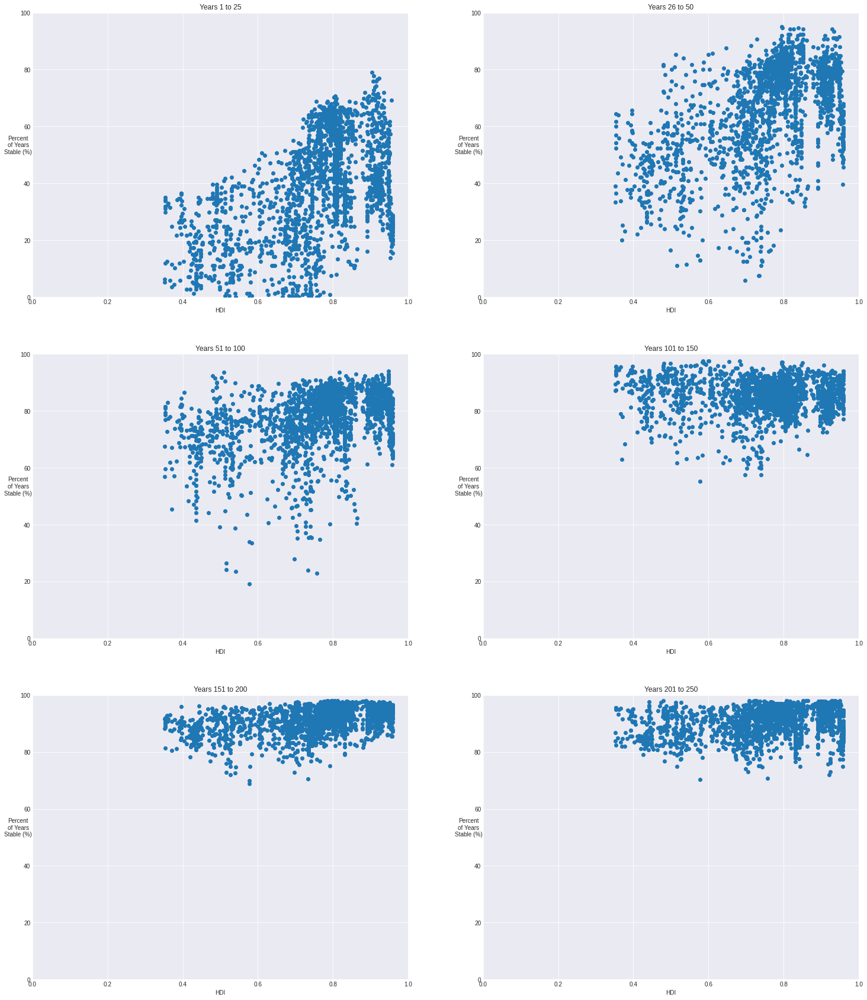

In [572]:
fig = plt.figure(figsize=(25, 30))
plt.style.use('seaborn-darkgrid')
periods = percent_mean_ds.period.values[:6]

for plot_num, period in enumerate(periods, 1):
    
    ax = fig.add_subplot(int(np.ceil(len(periods)/2)), 2, plot_num)
    percent_mean_single_period_da = percent_mean_ds.sel(period=period)
    percent_mean_matched = percent_mean_single_period_da.where(np.isfinite(hdi_regrid_single_t_da))
    
    
    merged_ds = xr.merge([percent_mean_matched, hdi_regrid_single_t_da])
    merged_ds.plot.scatter(ax = ax, y='percent', x='HDI')
    
    
    ax.set_title(period)
    ax.set_xlabel('HDI', size = 10)
    ax.set_ylabel('Percent\nof Years\nStable (%)', size=10, rotation=0)
    ax.set_title(convert_period_string(period), fontsize=12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)
    
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 100])
    
    
# fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, '07_perent_stable_hdi_model_mean.png'),
#            bbox_inches='tight', dpi =300)

# Consecutive Metrics

In [32]:
def single_plot(fig, ax, data, title=''):
    
    data.plot(ax=ax, cmap='Reds', robust=True)

    ax.set_title(title)
    ax.coastlines(alpha=0.7)
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.right_labels = False
    gl.top_labels = False


In [52]:
consec_ds

<xarray.Dataset>
Dimensions:              (lon: 144, lat: 72, model: 9)
Coordinates:
    time                 object 0000-12-31 00:00:00
  * lon                  (lon) float64 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * lat                  (lat) float64 -88.75 -86.25 -83.75 ... 86.25 88.75
  * model                (model) object 'MPIESM12' 'IPSLCM5A' ... 'CCSM3'
Data variables:
    first_stable         (model, lat, lon) float64 21.0 21.0 21.0 ... 15.0 15.0
    average_length       (model, lat, lon) float64 25.94 24.53 ... 117.2 117.2
    number_periods       (model, lat, lon) float64 16.0 17.0 15.0 ... 4.0 4.0
    total_time_stable    (model, lat, lon) float64 415.0 417.0 ... 469.0 469.0
    percent_time_stable  (model, lat, lon) float64 82.83 83.23 ... 93.61 93.61

In [53]:
consec_ds_range = consec_ds.max(dim='model') - consec_ds.min(dim='model')

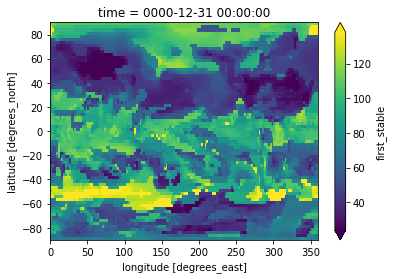

In [54]:
consec_ds_range['first_stable'].plot(robust=True)

In [58]:
def single_plot(fig, ax, data, title=''):
    
    data.plot(ax=ax, cmap='Reds', robust=True)

    ax.set_title(title)
    ax.coastlines(alpha=0.7)
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.right_labels = False
    gl.top_labels = False


In [74]:
import cartopy.crs as ccrs

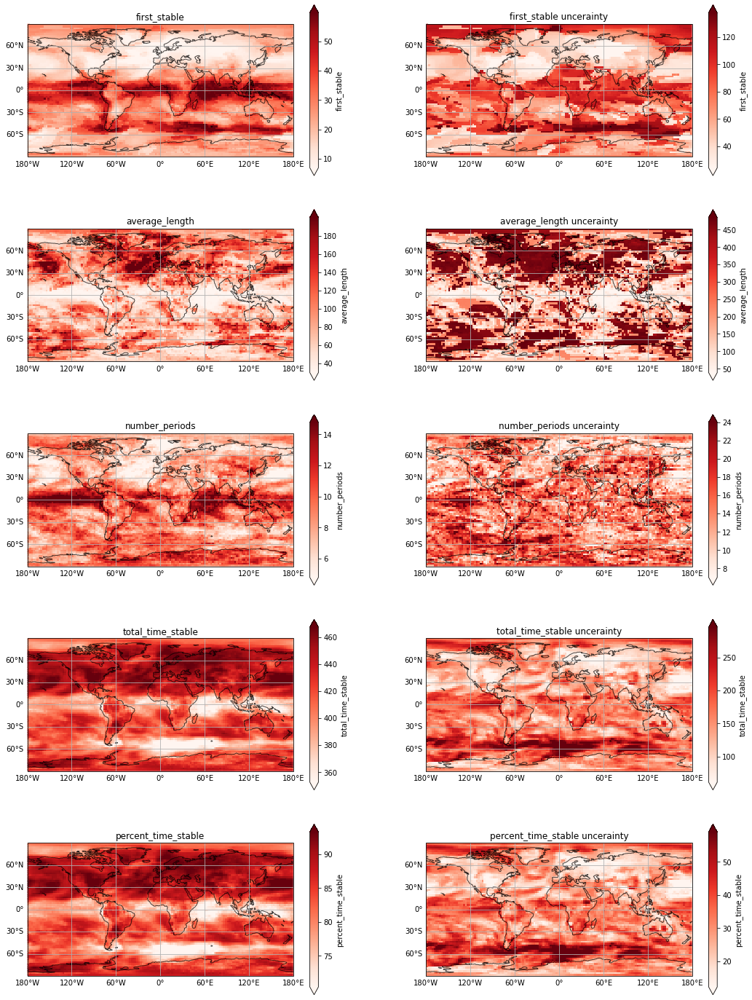

In [59]:
data_vars = list(consec_ds.data_vars)
fig = plt.figure(figsize = (18, 5 * len(data_vars)))

i = 0
for dvar in data_vars:
    ax = fig.add_subplot(len(data_vars), 2, i+1, projection=ccrs.PlateCarree())
    single_plot(fig, ax, consec_ds[dvar].mean(dim='model'), dvar)
    i += 1
    
    ax = fig.add_subplot(len(data_vars), 2, i+1, projection=ccrs.PlateCarree())
    single_plot(fig, ax, consec_ds_range[dvar], dvar + ' uncerainty')
    i += 1


In [69]:

def plot_all_model_maps(ds, variable):
    da = ds[variable]
    models = list(da.model.values)
    fig = plt.figure(figsize = (18, 5 * len(data_vars)))

    for i,model in enumerate(models):
        ax = fig.add_subplot(int(np.ceil(len(models)/2)), 2, i+1, projection=ccrs.PlateCarree())
        single_plot(fig, ax, da.sel(model=model), model)


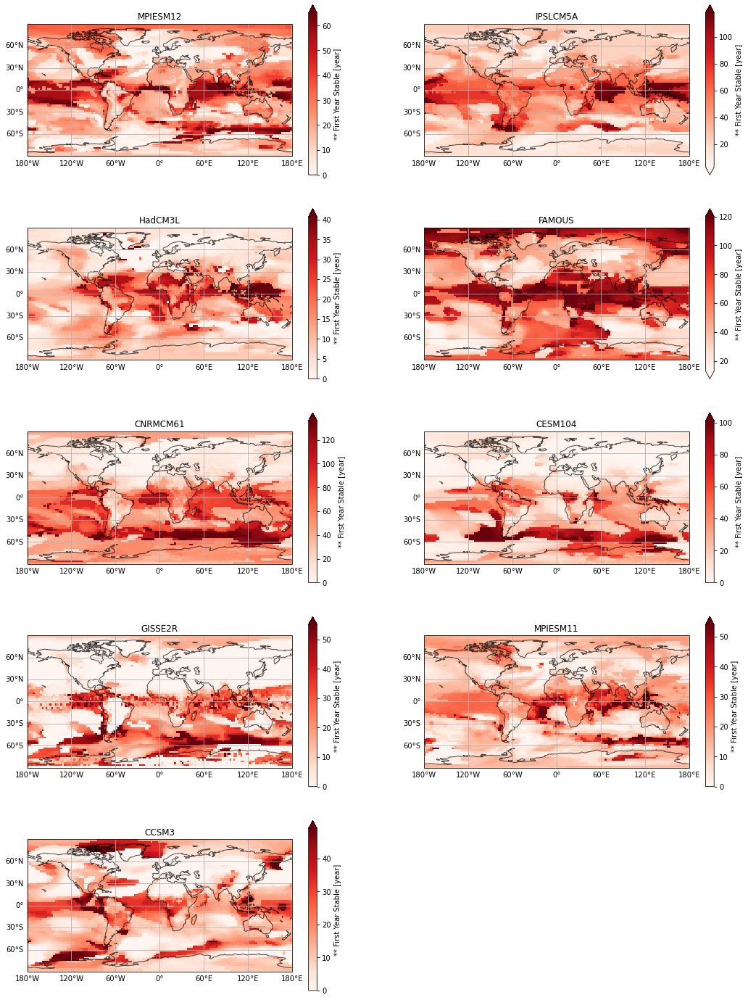

In [71]:
plot_all_model_maps(consec_ds, 'first_stable')

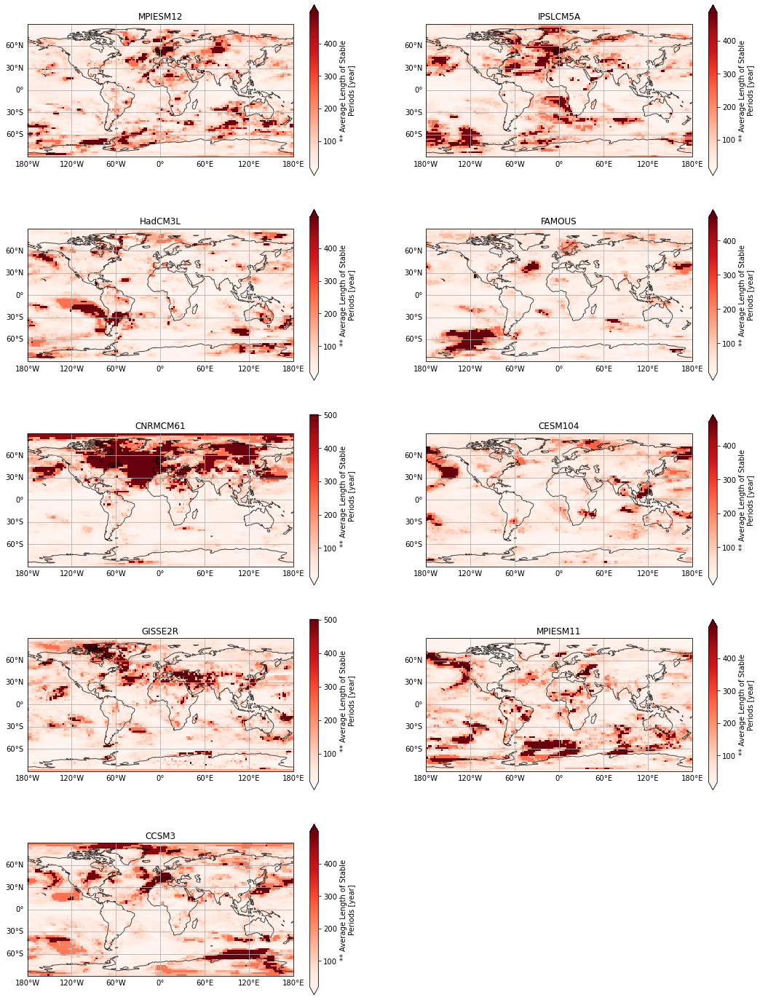

In [72]:
plot_all_model_maps(consec_ds, 'average_length')

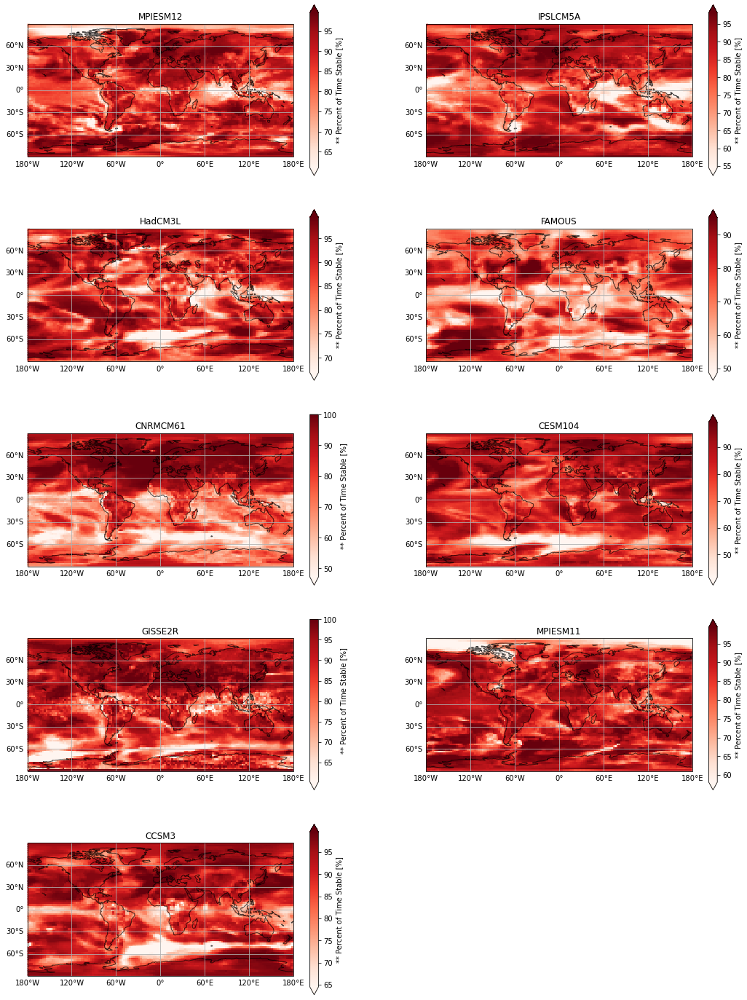

In [73]:
plot_all_model_maps(consec_ds, 'percent_time_stable')